In [2]:
import pandas as pd
import numpy as np
import openpyxl
from datetime import datetime

# 数据预处理

In [3]:
# 加载数据
medals_df = pd.read_excel(r'D:/mcm2025/data/raw/changed_medal_counts.xlsx')
hosts_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_hosts.csv')
programs_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_programs.csv', encoding='ISO-8859-1')
athletes_df = pd.read_excel(r'D:/mcm2025/data/raw/changed_athletes.xlsx')

# 查看数据结构，确保正确加载
print(medals_df.head())
print(hosts_df.head())
print(programs_df.head())
print(athletes_df.head())


   Rank             NOC  Gold  Silver  Bronze  Total  Year
0     1  United States'    11       7       2     20  1896
1     2         Greece'    10      18      19     47  1896
2     3        Germany'     6       5       2     13  1896
3     4         France'     5       4       2     11  1896
4     5  Great Britain'     2       3       2      7  1896
   Year                       Host
0  1896             Athens, Greece
1  1900              Paris, France
2  1904   St. Louis, United States
3  1908     London, United Kingdom
4  1912          Stockholm, Sweden
      Sport         Discipline Code Sports Governing Body 1896 1900 1904  \
0  Aquatics  Artistic Swimming  SWA        World Aquatics    0    0    0   
1  Aquatics             Diving  DIV        World Aquatics    0    0    2   
2  Aquatics  Marathon Swimming  OWS        World Aquatics    0    0    0   
3  Aquatics           Swimming  SWM        World Aquatics    4    7    9   
4  Aquatics         Water Polo  WPO        World Aquatic

In [21]:
medals_df['NOC'] = medals_df['NOC'].str.replace("'", "")

In [4]:
# 检查缺失值
print(medals_df.isnull().sum())
print(hosts_df.isnull().sum())
print(programs_df.isnull().sum())
print(athletes_df.isnull().sum())

# 如果存在缺失值，根据情况填补或删除
medals_df.dropna(subset=['Gold', 'Silver', 'Bronze', 'Total'], inplace=True)
athletes_df.dropna(subset=['Name', 'Team', 'Medal'], inplace=True)


Rank      0
NOC       0
Gold      0
Silver    0
Bronze    0
Total     0
Year      0
dtype: int64
Year    0
Host    0
dtype: int64
Sport                    0
Discipline               2
Code                     0
Sports Governing Body    0
1896                     0
1900                     0
1904                     0
1906*                    0
1908                     0
1912                     0
1920                     0
1924                     0
1928                     2
1932                     2
1936                     2
1948                     2
1952                     2
1956                     2
1960                     2
1964                     2
1968                     2
1972                     2
1976                     2
1980                     2
1984                     2
1988                     3
1992                     2
1996                     2
2000                     2
2004                     2
2008                     2
2012                     2
2016  

In [5]:
# 将年份列转换为整数类型
medals_df['Year'] = medals_df['Year'].astype(int)
hosts_df['Year'] = hosts_df['Year'].astype(int)
athletes_df['Year'] = athletes_df['Year'].astype(int)

# 将奖牌数量转换为整数类型
medals_df['Gold'] = medals_df['Gold'].astype(int)
medals_df['Silver'] = medals_df['Silver'].astype(int)
medals_df['Bronze'] = medals_df['Bronze'].astype(int)
medals_df['Total'] = medals_df['Total'].astype(int)


In [6]:
# 合并奖牌数据和运动员数据
merged_df = pd.merge(athletes_df, medals_df, how='left', left_on=['NOC', 'Year'], right_on=['NOC', 'Year'])

# 检查合并后的数据
print(merged_df.head())


                    Name Sex            Team  NOC  Year         City  \
0              A Dijiang   M           China  CHN  1992    Barcelona   
1               A Lamusi   M           China  CHN  2012       London   
2            Gunnar Aaby   M         Denmark  DEN  1920    Antwerpen   
3            Edgar Aabye   M  Denmark/Sweden  DEN  1900        Paris   
4  Cornelia (-strannood)   F     Netherlands  NED  1932  Los Angeles   

        Sport                         Event     Medal  Rank  Gold  Silver  \
0  Basketball   Basketball Men's Basketball  No medal   NaN   NaN     NaN   
1        Judo  Judo Men's Extra-Lightweight  No medal   NaN   NaN     NaN   
2    Football       Football Men's Football  No medal   NaN   NaN     NaN   
3  Tug-Of-War   Tug-Of-War Men's Tug-Of-War      Gold   NaN   NaN     NaN   
4   Athletics  Athletics Women's 100 metres  No medal   NaN   NaN     NaN   

   Bronze  Total  
0     NaN    NaN  
1     NaN    NaN  
2     NaN    NaN  
3     NaN    NaN  
4     NaN

# 特征工程

In [7]:
# 合并东道主信息
merged_df = pd.merge(merged_df, hosts_df[['Year', 'Host']], how='left', on='Year')

# 如果没有主办国信息，则填充为0（不是东道主）
merged_df['Host'].fillna(0, inplace=True)

# 检查更新后的数据
print(merged_df.head())


                    Name Sex            Team  NOC  Year         City  \
0              A Dijiang   M           China  CHN  1992    Barcelona   
1               A Lamusi   M           China  CHN  2012       London   
2            Gunnar Aaby   M         Denmark  DEN  1920    Antwerpen   
3            Edgar Aabye   M  Denmark/Sweden  DEN  1900        Paris   
4  Cornelia (-strannood)   F     Netherlands  NED  1932  Los Angeles   

        Sport                         Event     Medal  Rank  Gold  Silver  \
0  Basketball   Basketball Men's Basketball  No medal   NaN   NaN     NaN   
1        Judo  Judo Men's Extra-Lightweight  No medal   NaN   NaN     NaN   
2    Football       Football Men's Football  No medal   NaN   NaN     NaN   
3  Tug-Of-War   Tug-Of-War Men's Tug-Of-War      Gold   NaN   NaN     NaN   
4   Athletics  Athletics Women's 100 metres  No medal   NaN   NaN     NaN   

   Bronze  Total                         Host  
0     NaN    NaN             Barcelona, Spain  
1     Na

In [8]:
# 为运动员创建一个新的列，表示奖牌类型
merged_df['Medal_Type'] = np.where(merged_df['Medal'] == 'Gold', 'Gold',
                                   np.where(merged_df['Medal'] == 'Silver', 'Silver',
                                            np.where(merged_df['Medal'] == 'Bronze', 'Bronze', 'No Medal')))

# 检查创建的奖牌类型列
print(merged_df[['Name', 'Medal_Type']].head())


                    Name Medal_Type
0              A Dijiang   No Medal
1               A Lamusi   No Medal
2            Gunnar Aaby   No Medal
3            Edgar Aabye       Gold
4  Cornelia (-strannood)   No Medal


In [9]:
# 计算国家的奖牌增速（例如金牌数量变化）
medals_df['Gold_Change'] = medals_df.groupby('NOC')['Gold'].pct_change()  # 使用百分比变化

# 如果是首次参加奥运会，设置增速为0
medals_df['Gold_Change'].fillna(0, inplace=True)

# 检查添加的增速特征
print(medals_df[['NOC', 'Year', 'Gold_Change']].head())


              NOC  Year  Gold_Change
0  United States'  1896          0.0
1         Greece'  1896          0.0
2        Germany'  1896          0.0
3         France'  1896          0.0
4  Great Britain'  1896          0.0


In [45]:
# # 保存清洗后的数据
# merged_df.to_csv('cleaned_olympic_data.csv', index=False)


C:\Users\alanz\AppData\Local\Temp\ipykernel_25652\326999145.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Gold', y='NOC', data=medals_2024_sorted, palette='viridis')


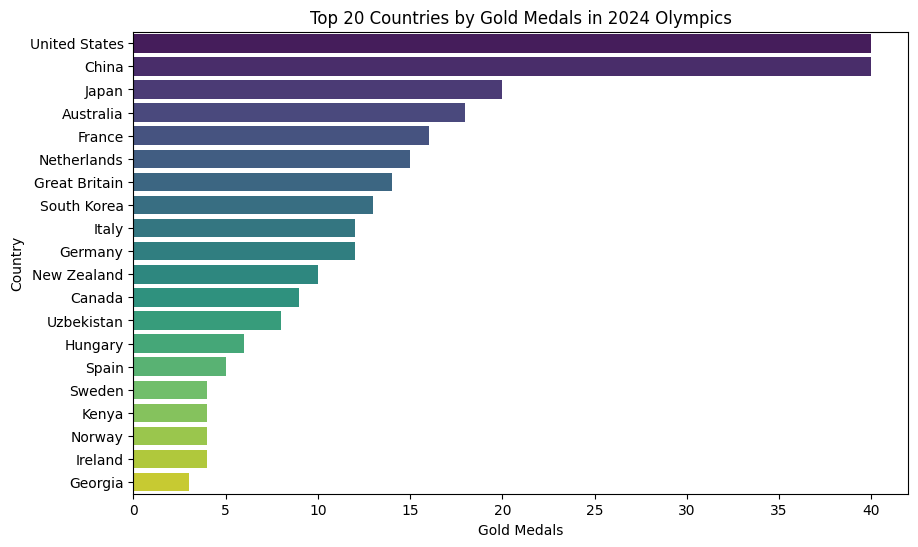

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# 假设我们分析的是2024年奥运会金牌数量的排名
year = 2024
top_n = 20  # 显示排名前20的国家

# 筛选数据
medals_2024 = medals_df[medals_df['Year'] == year]
medals_2024_sorted = medals_2024.sort_values(by='Gold', ascending=False).head(top_n)

# 绘制条形图
plt.figure(figsize=(10, 6))
sns.barplot(x='Gold', y='NOC', data=medals_2024_sorted, palette='viridis')
plt.title(f'Top {top_n} Countries by Gold Medals in {year} Olympics')
plt.xlabel('Gold Medals')
plt.ylabel('Country')
plt.show()


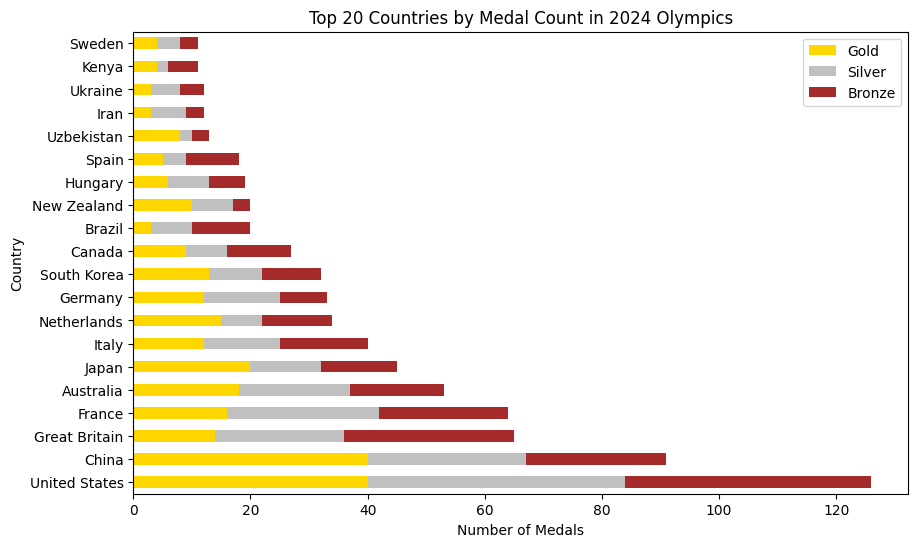

In [23]:
# 假设我们分析的是2024年奥运会的奖牌分布
medals_2024 = medals_df[medals_df['Year'] == 2024]
medals_2024_sorted = medals_2024.sort_values(by='Total', ascending=False).head(top_n)

# 堆叠条形图，显示金、银、铜奖牌比例
fig, ax = plt.subplots(figsize=(10, 6))
medals_2024_sorted.set_index('NOC')[['Gold', 'Silver', 'Bronze']].plot(kind='barh', stacked=True, ax=ax, color=['gold', 'silver', 'brown'])
plt.title(f'Top {top_n} Countries by Medal Count in {year} Olympics')
plt.xlabel('Number of Medals')
plt.ylabel('Country')
plt.show()


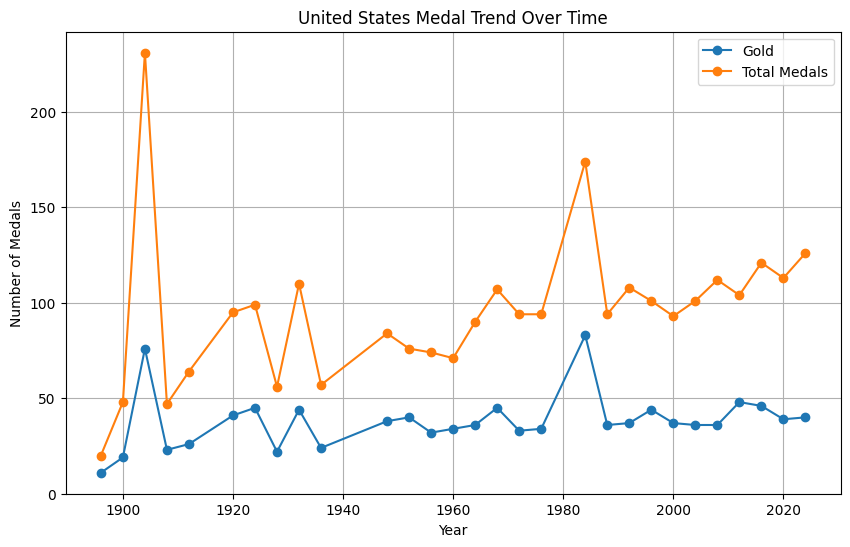

In [24]:
# 假设我们分析的是某个国家（例如美国）的奖牌数量变化趋势
country = 'United States'

# 筛选数据
usa_medals = medals_df[medals_df['NOC'] == country]

# 绘制折线图
plt.figure(figsize=(10, 6))
plt.plot(usa_medals['Year'], usa_medals['Gold'], label='Gold', marker='o')
plt.plot(usa_medals['Year'], usa_medals['Total'], label='Total Medals', marker='o')
plt.title(f'{country} Medal Trend Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Medals')
plt.legend()
plt.grid(True)
plt.show()


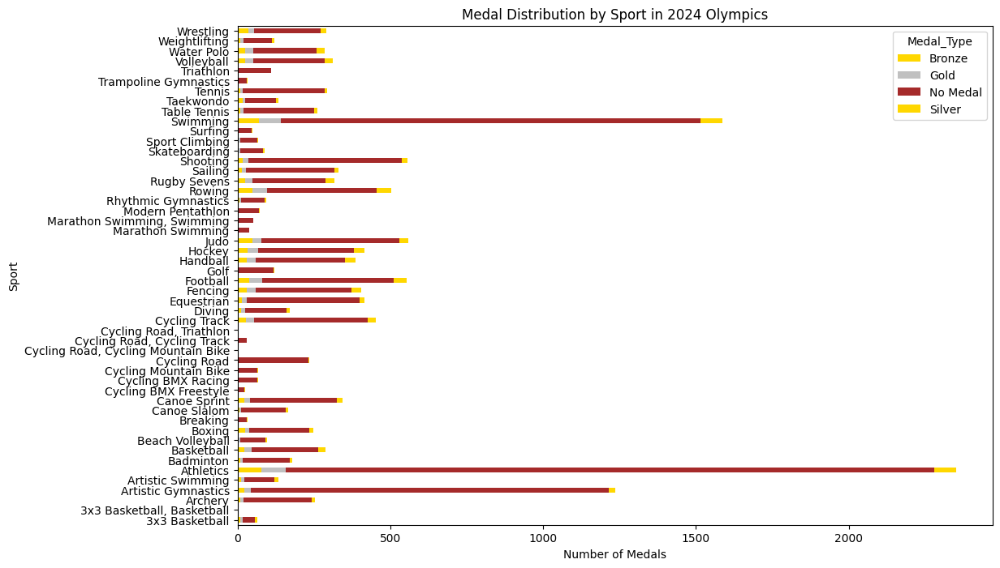

In [25]:
# 假设我们分析的是2024年奥运会的不同项目奖牌分布
year = 2024
projects = merged_df[merged_df['Year'] == year]

# 按照项目和奖牌类型进行汇总
project_medals = projects.groupby(['Sport', 'Medal_Type']).size().unstack(fill_value=0)

# 绘制堆叠条形图
project_medals.plot(kind='barh', stacked=True, figsize=(12, 8), color=['gold', 'silver', 'brown'])
plt.title(f'Medal Distribution by Sport in {year} Olympics')
plt.xlabel('Number of Medals')
plt.ylabel('Sport')
plt.show()


C:\Users\alanz\AppData\Local\Temp\ipykernel_25652\2352914429.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_increment_countries.index, y=top_increment_countries['Gold_Increment'], palette='coolwarm')


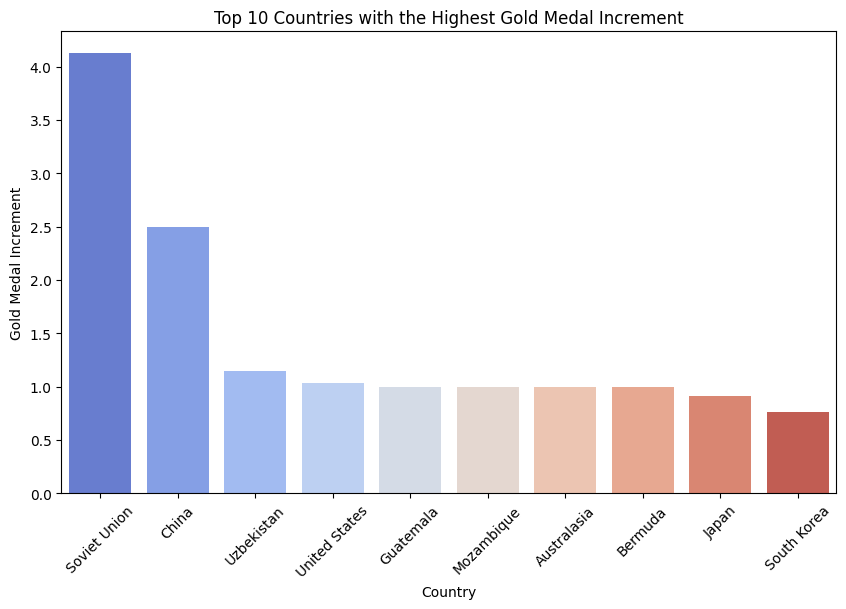

In [26]:
# 计算每个国家金牌的增量（即每届奥运会金牌数的差值）
medals_df['Gold_Increment'] = medals_df.groupby('NOC')['Gold'].diff()

# 按照增量排序，并展示前10名
top_increment_countries = medals_df.groupby('NOC').agg({'Gold_Increment': 'mean'}).sort_values(by='Gold_Increment', ascending=False).head(10)

# 绘制柱状图
plt.figure(figsize=(10, 6))
sns.barplot(x=top_increment_countries.index, y=top_increment_countries['Gold_Increment'], palette='coolwarm')
plt.title('Top 10 Countries with the Highest Gold Medal Increment')
plt.xlabel('Country')
plt.ylabel('Gold Medal Increment')
plt.xticks(rotation=45)
plt.show()


# 构建模型

In [27]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt


In [28]:
# 引入项目因素
events = pd.read_csv(r'D:/mcm2025/data/processed/events.csv')
events

,Year,Total events,Total disciplines,Total sports
0,1896,43,10,11
1,1900,97,22,20
2,1904,95,18,16
3,1906,76,13,11
4,1908,110,25,22
5,1912,102,18,14
6,1920,156,29,22
7,1924,126,23,17
8,1928,109,20,14
9,1932,117,20,14


## 去掉取消年份的比赛

In [29]:
hosts_df = pd.merge(hosts_df, events, on='Year', how='left')
hosts_df

,Year,Host,Total events,Total disciplines,Total sports
0,1896,"Athens, Greece",43.0,10.0,11.0
1,1900,"Paris, France",97.0,22.0,20.0
2,1904,"St. Louis, United States",95.0,18.0,16.0
3,1908,"London, United Kingdom",110.0,25.0,22.0
4,1912,"Stockholm, Sweden",102.0,18.0,14.0
5,1916,Cancelled (WWI – Berlin had been awarded),NaN,NaN,NaN
6,1920,"Antwerp, Belgium",156.0,29.0,22.0
7,1924,"Paris, France",126.0,23.0,17.0
8,1928,"Amsterdam, Netherlands",109.0,20.0,14.0
9,1932,"Los Angeles, United States",117.0,20.0,14.0


In [30]:
hosts_df.dropna(inplace=True)
hosts_df

,Year,Host,Total events,Total disciplines,Total sports
0,1896,"Athens, Greece",43.0,10.0,11.0
1,1900,"Paris, France",97.0,22.0,20.0
2,1904,"St. Louis, United States",95.0,18.0,16.0
3,1908,"London, United Kingdom",110.0,25.0,22.0
4,1912,"Stockholm, Sweden",102.0,18.0,14.0
6,1920,"Antwerp, Belgium",156.0,29.0,22.0
7,1924,"Paris, France",126.0,23.0,17.0
8,1928,"Amsterdam, Netherlands",109.0,20.0,14.0
9,1932,"Los Angeles, United States",117.0,20.0,14.0
10,1936,"Berlin, Germany",129.0,25.0,19.0


In [31]:
# 确保 'Host' 列是字符串类型
hosts_df['Host'] = hosts_df['Host'].astype(str)

# 使用 str.split 分割并处理缺失值
split_hosts = hosts_df['Host'].str.split(',', expand=True)

# 检查是否分割成功，如果是两列就分别赋值给 'City' 和 'NOC'
if split_hosts.shape[1] == 2:
    hosts_df['City'] = split_hosts[0].str.strip()  # City是分割后的第1列
    hosts_df['NOC'] = split_hosts[1].str.strip()   # NOC是分割后的第2列
else:
    # 如果某些行没有正确分割，填充缺失值或输出警告
    hosts_df['City'] = split_hosts[0].str.strip()  # 即使不符合预期，仍处理City列
    hosts_df['NOC'] = None  # 给NOC列赋缺失值，表示数据不正确
hosts_df
# 添加host列到medals_df
medals_df['host'] = medals_df.apply(
    lambda row: 1 if row['Year'] in hosts_df['Year'].values and row['NOC'] in hosts_df[hosts_df['Year'] == row['Year']]['NOC'].values else 0,
    axis=1
)

medals_df

,Rank,NOC,Gold,Silver,Bronze,Total,Year,Gold_Change,Gold_Increment,host
0,1,United States,11,7,2,20,1896,0.0,NaN,0
1,2,Greece,10,18,19,47,1896,0.0,NaN,1
2,3,Germany,6,5,2,13,1896,0.0,NaN,0
3,4,France,5,4,2,11,1896,0.0,NaN,0
4,5,Great Britain,2,3,2,7,1896,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...
1430,84,Qatar,0,0,1,1,2024,-1.0,-2.0,0
1431,84,Refugee Olympic Team,0,0,1,1,2024,0.0,NaN,0
1432,84,Singapore,0,0,1,1,2024,-1.0,-1.0,0
1433,84,Slovakia,0,0,1,1,2024,-1.0,-1.0,0


In [32]:
# years = list(range(1986, 2025, 4))

grouped_by_noc = medals_df.groupby('NOC')

# 创建一个新的DataFrame用来存储填充后的数据
filled_data = []

# 遍历每个国家
for noc, group in grouped_by_noc:
    # 创建该国家的完整年份数据
    full_years = pd.DataFrame({'Year': hosts_df['Year']})
    
    # 合并该国家的原始数据和完整年份数据
    full_group = pd.merge(full_years, group, on='Year', how='left')
 
    full_group['NOC'] = noc
    full_group['Gold'] = full_group['Gold'].fillna(0)
    full_group['Rank'] = full_group['Rank'].fillna(100)
    full_group['Silver'] = full_group['Silver'].fillna(0)
    full_group['Bronze'] = full_group['Bronze'].fillna(0)
    full_group['Total'] = full_group['Total'].fillna(0)
    full_group['host'] = full_group['host'].fillna(0)
    
    # 将填充后的数据添加到最终的DataFrame中
    filled_data.append(full_group)

# 合并所有国家的数据
final_filled_df = pd.concat(filled_data, ignore_index=True)

final_filled_df = pd.merge(final_filled_df, hosts_df[['Year', 'Total events', 'Total disciplines', 'Total sports']], on='Year', how='left')

# 查看填充后的数据
final_filled_df

,Year,Rank,NOC,Gold,Silver,Bronze,Total,Gold_Change,Gold_Increment,host,Total events,Total disciplines,Total sports
0,1896,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,43.0,10.0,11.0
1,1900,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,97.0,22.0,20.0
2,1904,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,95.0,18.0,16.0
3,1908,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,110.0,25.0,22.0
4,1912,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,102.0,18.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4829,2008,38.0,Zimbabwe,1.0,3.0,0.0,4.0,0.0,0.0,0.0,302.0,42.0,27.0
4830,2012,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,302.0,40.0,26.0
4831,2016,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,306.0,42.0,28.0
4832,2020,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,339.0,50.0,33.0


In [33]:
# 计算gold——increment

# Gold_Increment 是当前金牌和上一届金牌的差值
final_filled_df['Gold_Increment'] = final_filled_df['Gold'] - final_filled_df['Gold'].shift(1, fill_value=0)

# Gold_Change 是 Gold_Increment / 上一届的金牌数
final_filled_df['Gold_Change'] = final_filled_df['Gold_Increment'] 

final_filled_df

,Year,Rank,NOC,Gold,Silver,Bronze,Total,Gold_Change,Gold_Increment,host,Total events,Total disciplines,Total sports
0,1896,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,10.0,11.0
1,1900,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,97.0,22.0,20.0
2,1904,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,95.0,18.0,16.0
3,1908,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,25.0,22.0
4,1912,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,102.0,18.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4829,2008,38.0,Zimbabwe,1.0,3.0,0.0,4.0,0.0,0.0,0.0,302.0,42.0,27.0
4830,2012,100.0,Zimbabwe,0.0,0.0,0.0,0.0,-1.0,-1.0,0.0,302.0,40.0,26.0
4831,2016,100.0,Zimbabwe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,306.0,42.0,28.0
4832,2020,100.0,Zimbabwe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,339.0,50.0,33.0


In [34]:
# 泊松分布
def custom_round(value):
    integer_part = np.floor(value)
    decimal_part = value - integer_part
    
    if np.random.rand() < decimal_part: 
        return integer_part + 1
    else:
        return integer_part

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

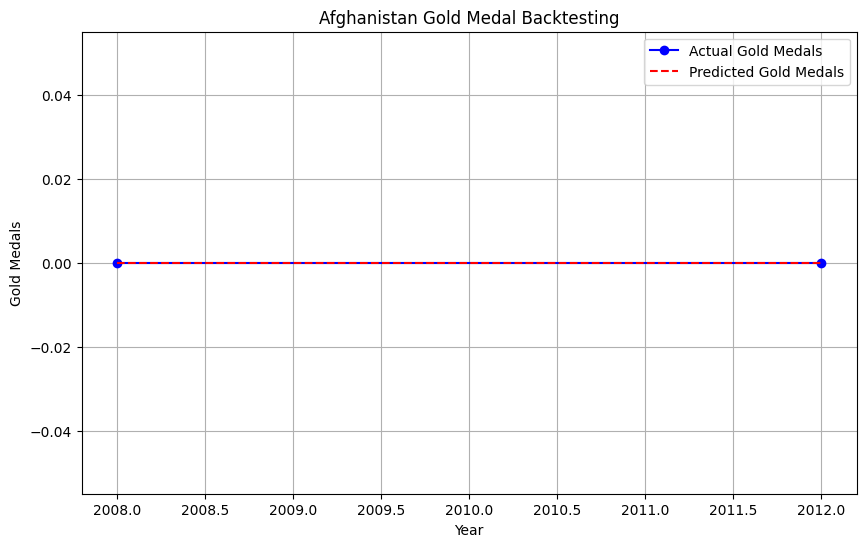

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

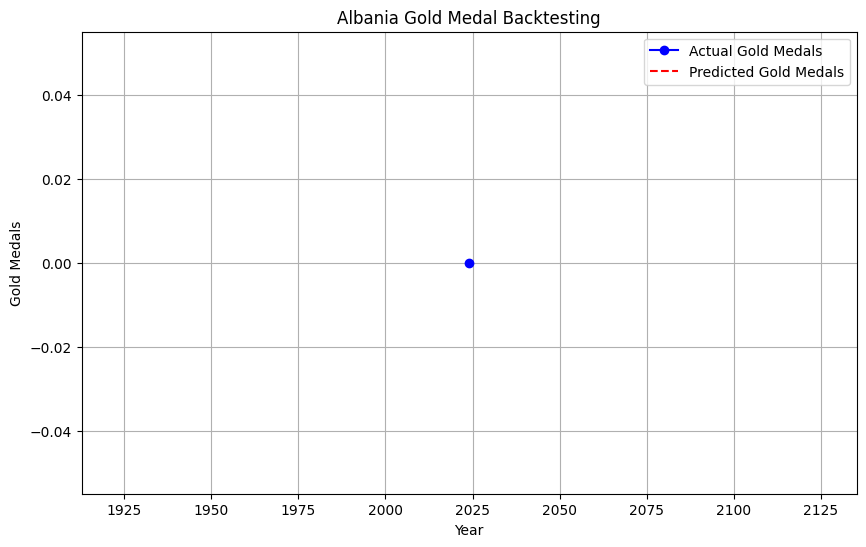

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

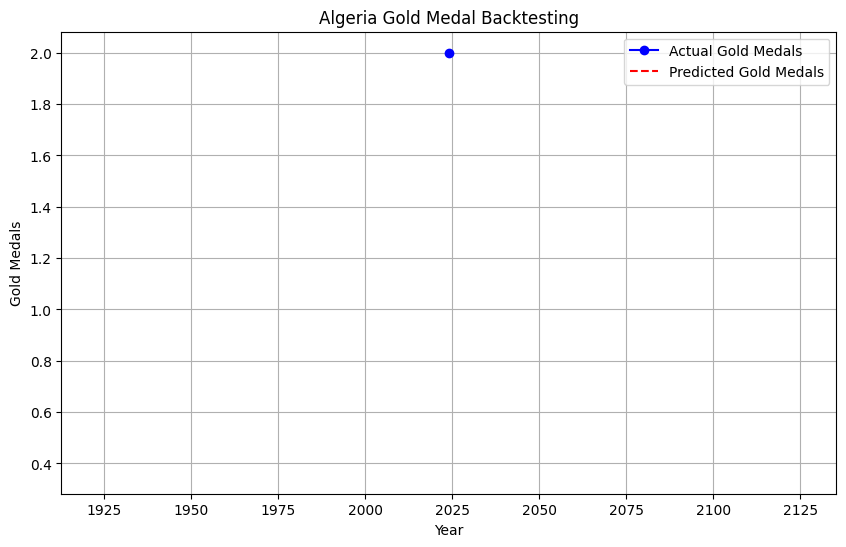

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

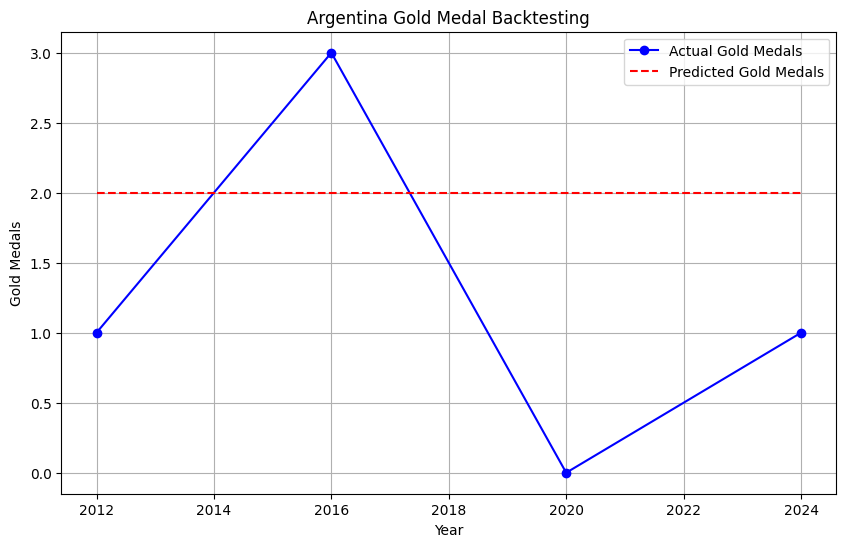

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

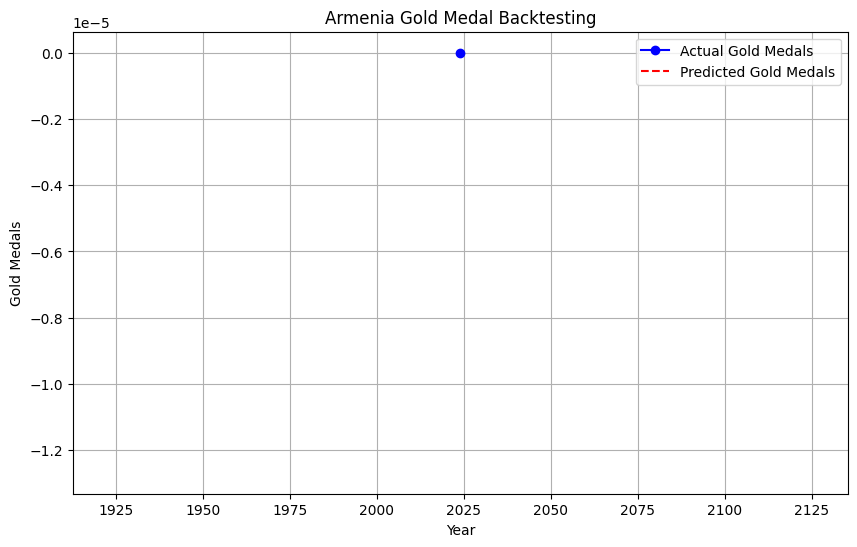

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

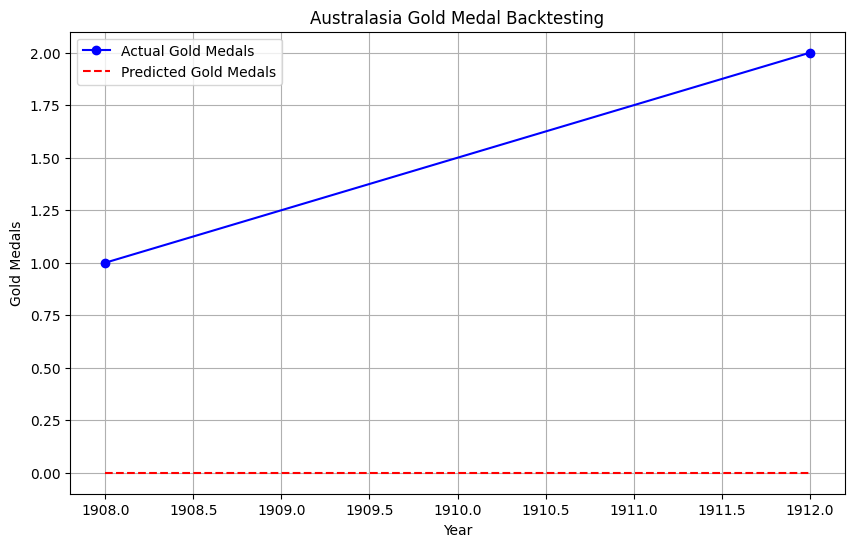

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

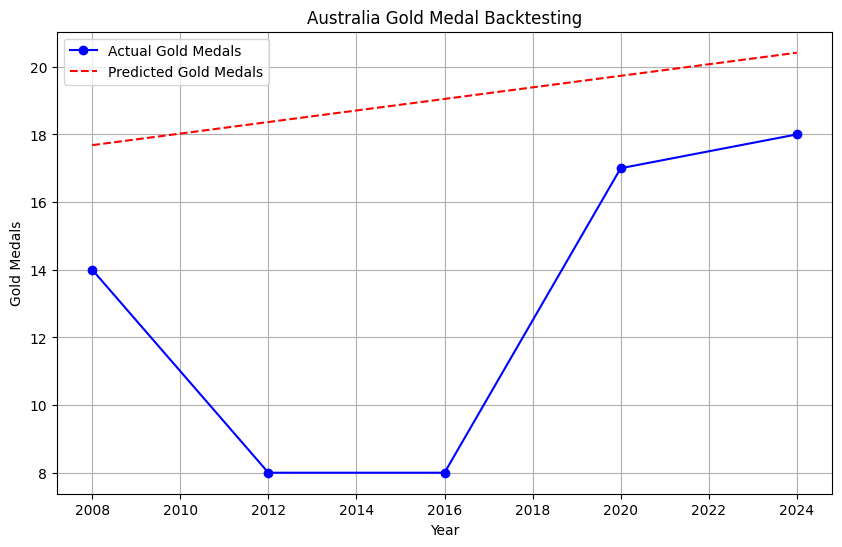

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

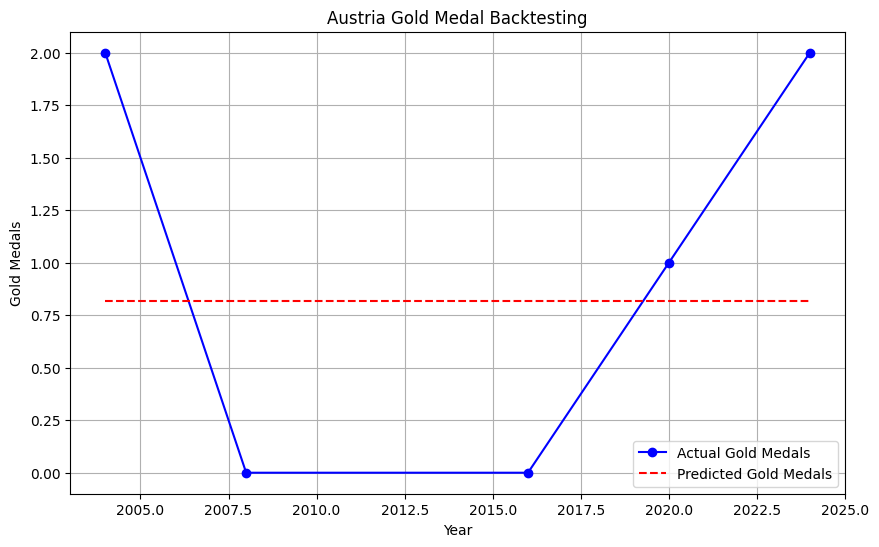

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

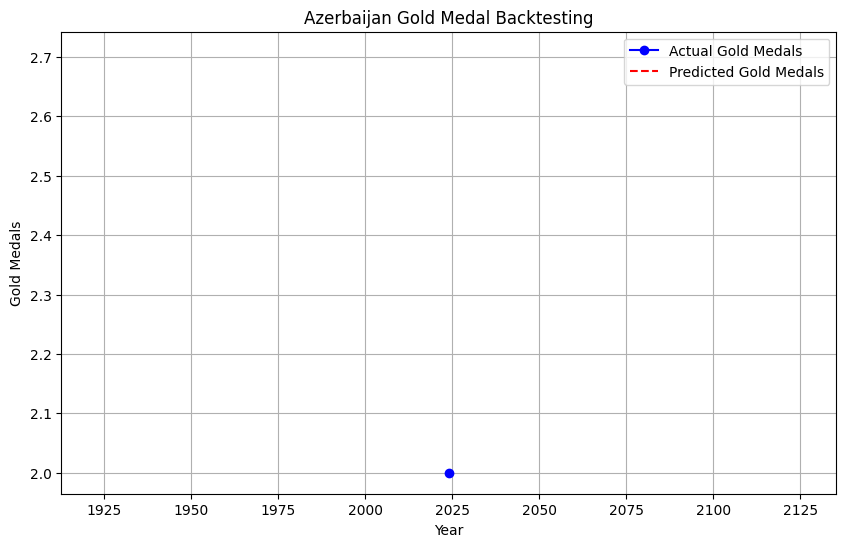

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

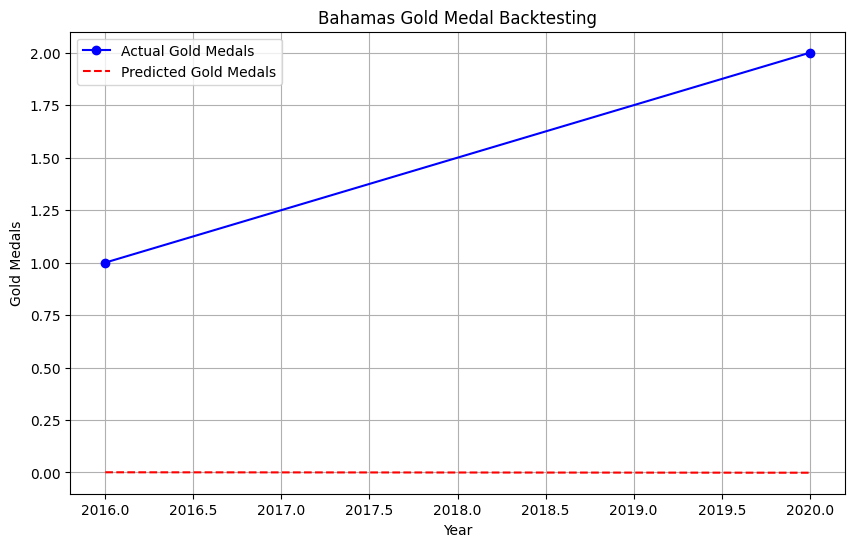

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

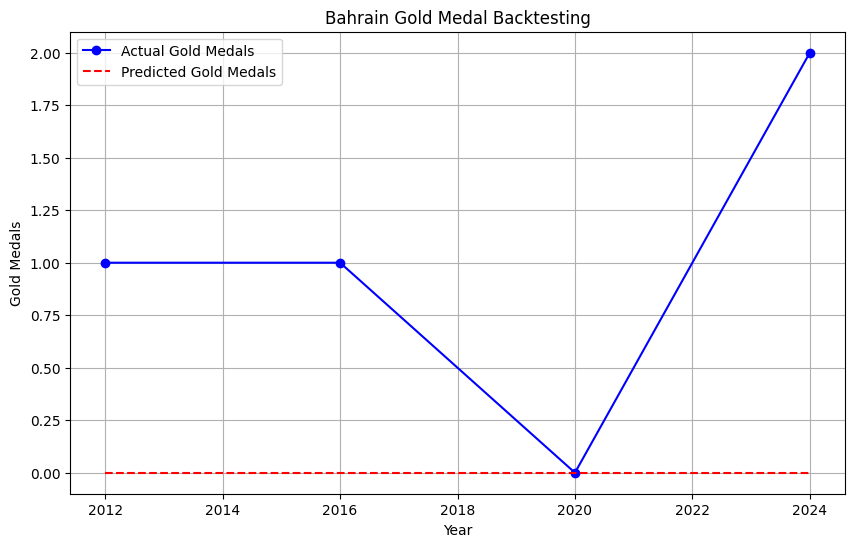

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

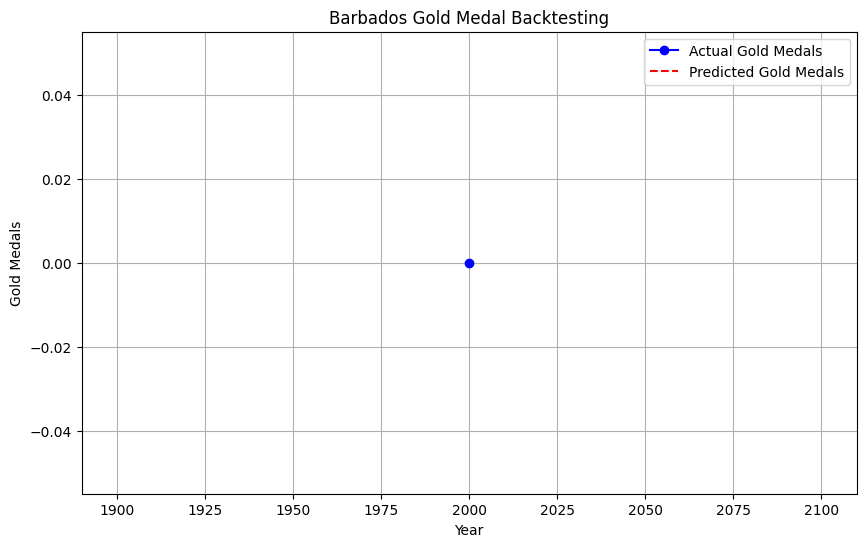

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

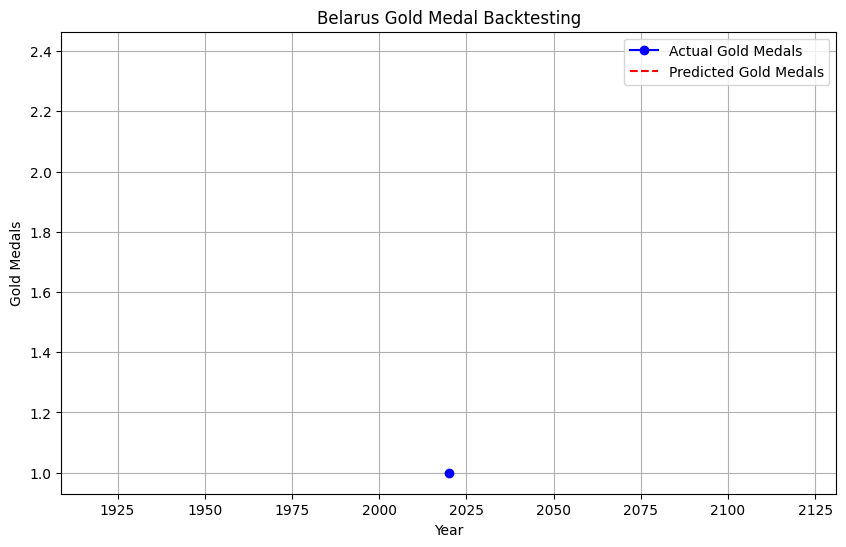

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

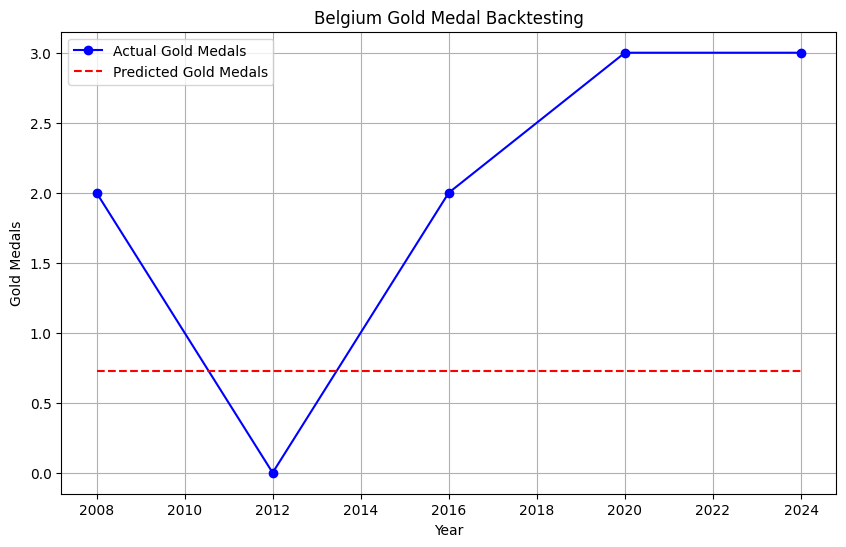

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

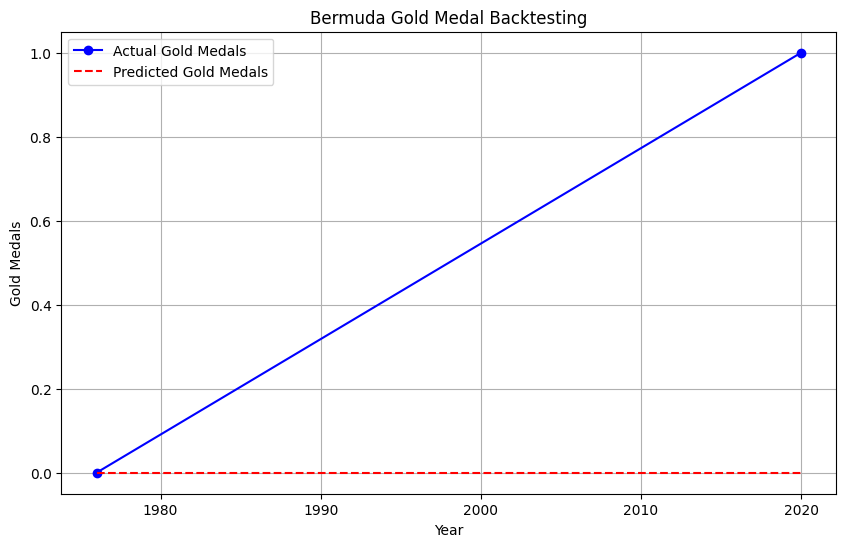

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

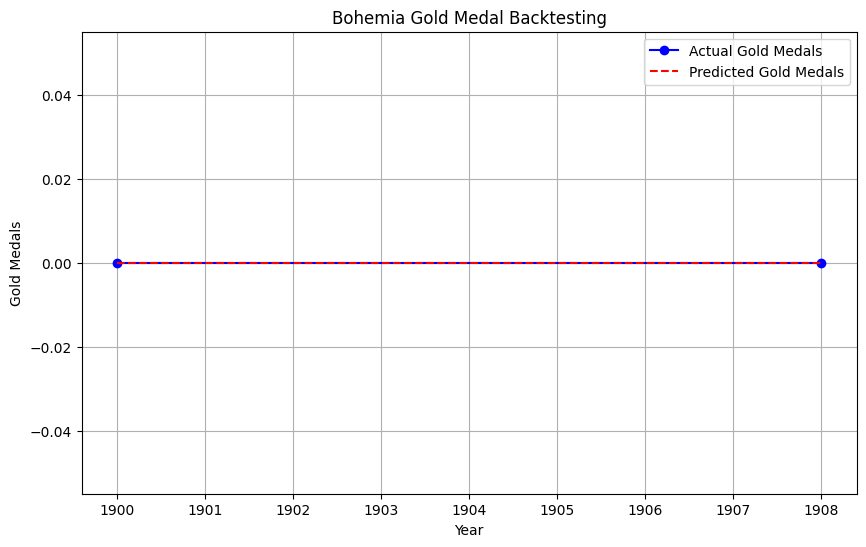

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1026: RuntimeWarning: invalid value encountered in scalar divide
  params_variance = np.inner(endog, endog) / self.nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:534: RuntimeWarning: invalid value encountered in scalar divide
  return -self.loglike(params, *args) / nobs
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmod

KeyboardInterrupt: 

In [35]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# 定义函数用于安全预测
def safe_arima_forecast(train_data, test_data, steps, max_order=(5, 2, 5)):
    """
    使用ARIMA模型进行预测并根据AIC选择最佳模型
    :param train_data: 训练数据 (pd.Series)
    :param test_data: 测试数据 (pd.Series)
    :param steps: 预测步数
    :param max_order: ARIMA模型的最大参数范围 (p, d, q)
    :return: 最佳预测结果和误差指标
    """
    best_aic = np.inf
    best_forecast = None
    best_model = None

    # 遍历不同的参数组合
    for p in range(max_order[0]+1):
        for d in range(max_order[1]+1):
            for q in range(max_order[2]+1):
                try:
                    model = ARIMA(train_data, order=(p, d, q))
                    model_fit = model.fit()
                    if model_fit.aic < best_aic:
                        best_aic = model_fit.aic
                        best_model = model_fit
                        # 如果有测试数据，进行预测和误差评估
                        if test_data is not None and len(test_data) == steps:
                            forecast = model_fit.forecast(steps=steps)
                            mse = mean_squared_error(test_data, forecast)
                            mae = mean_absolute_error(test_data, forecast)
                            best_forecast = {'forecast': forecast, 'mse': mse, 'mae': mae}
                        else:
                            # 如果没有测试数据，仅进行未来预测
                            forecast = model_fit.forecast(steps=steps)
                            best_forecast = {'forecast': forecast, 'mse': None, 'mae': None}
                except Exception as e:
                    continue

    if best_forecast is None:
        # 如果没有成功的模型拟合，返回默认值
        return {'forecast': np.array([0]*steps), 'mse': None, 'mae': None}
    return best_forecast

# 分割训练年份和回测年份
def split_train_test_by_year(data, test_ratio=0.2):
    """
    按年份分割训练集和测试集
    :param data: 包含年份索引的数据 (pd.Series)
    :param test_ratio: 测试集比例
    :return: 训练数据和测试数据
    """
    n_test = int(len(data) * test_ratio)
    train_data = data[:-n_test]
    test_data = data[-n_test:]
    return train_data, test_data

# 初始化预测年份
future_years = [2028]
predictions = {}

# 对每个国家进行训练、回测和预测
for noc, group in grouped_by_noc:
    # 确保数据按年份排序
    group = group.sort_values(by='Year')
    
    # 提取金牌、银牌、铜牌时间序列
    gold_data = group[['Year', 'Gold']].set_index('Year')['Gold'].dropna()
    silver_data = group[['Year', 'Silver']].set_index('Year')['Silver'].dropna()
    bronze_data = group[['Year', 'Bronze']].set_index('Year')['Bronze'].dropna()
    
    # 分割训练集和回测集
    gold_train, gold_test = split_train_test_by_year(gold_data, test_ratio=0.2)
    silver_train, silver_test = split_train_test_by_year(silver_data, test_ratio=0.2)
    bronze_train, bronze_test = split_train_test_by_year(bronze_data, test_ratio=0.2)
    
    # 使用训练集拟合并在回测集上验证
    gold_result = safe_arima_forecast(gold_train, gold_test, steps=len(gold_test))
    silver_result = safe_arima_forecast(silver_train, silver_test, steps=len(silver_test))
    bronze_result = safe_arima_forecast(bronze_train, bronze_test, steps=len(bronze_test))
    
    # 对未来年份进行预测
    gold_forecast = safe_arima_forecast(gold_data, None, steps=len(future_years))['forecast']
    silver_forecast = safe_arima_forecast(silver_data, None, steps=len(future_years))['forecast']
    bronze_forecast = safe_arima_forecast(bronze_data, None, steps=len(future_years))['forecast']
    
    # 保存预测和回测结果
    predictions[noc] = {
        'gold_backtest': gold_result,
        'silver_backtest': silver_result,
        'bronze_backtest': bronze_result,
        'gold_forecast': gold_forecast,
        'silver_forecast': silver_forecast,
        'bronze_forecast': bronze_forecast
    }

    # 可视化回测结果
    if not gold_test.empty:
        plt.figure(figsize=(10, 6))
        plt.plot(gold_test.index, gold_test, label="Actual Gold Medals", color="blue", marker='o')
        plt.plot(gold_test.index, gold_result['forecast'], label="Predicted Gold Medals", color="red", linestyle='--')
        plt.title(f"{noc} Gold Medal Backtesting")
        plt.xlabel("Year")
        plt.ylabel("Gold Medals")
        plt.legend()
        plt.grid()
        plt.show()

# 输出回测结果
for noc, result in predictions.items():
    print(f"NOC: {noc}")
    print(f"Gold MSE: {result['gold_backtest']['mse']}, MAE: {result['gold_backtest']['mae']}")
    print(f"Silver MSE: {result['silver_backtest']['mse']}, MAE: {result['silver_backtest']['mae']}")
    print(f"Bronze MSE: {result['bronze_backtest']['mse']}, MAE: {result['bronze_backtest']['mae']}")
    print("")


In [1]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 定义函数用于处理数据缺失的国家
from statsmodels.tsa.arima.model import ARIMA

# 定义函数用于找到最佳ARIMA模型和进行预测
def safe_arima_forecast(data, steps, max_order=(5, 2, 5)):
    # 保证数据量足够并且没有缺失值
    if len(data) > 10:  # 确保有足够的数据点来进行可靠的估计
        best_aic = np.inf
        best_model = None
        best_forecast = np.array([0] * steps)

        # 穷举所有可能的参数组合
        for p in range(max_order[0] + 1):
            for d in range(max_order[1] + 1):
                for q in range(max_order[2] + 1):
                    try:
                        # 拟合ARIMA模型
                        model = ARIMA(data, order=(p, d, q))
                        model_fit = model.fit()
                        # 检查是否为最佳AIC
                        if model_fit.aic < best_aic:
                            best_aic = model_fit.aic
                            best_model = model_fit
                            # 生成预测
                            best_forecast = model_fit.forecast(steps=steps)
                            best_forecast = np.array([max(0, round(v)) for v in best_forecast])  # 确保预测值为正整数
                    except Exception as e:
                        continue
        return best_forecast
    else:
        return np.array([0] * steps)  # 样本不足或其他异常时返回全0


# 初始化预测年份和结果存储
future_years = [2012, 2016, 2020, 2024, 2028]
predictions = {}

# 存储误差指标
errors = []

# 对每个国家进行时序预测
for noc, group in grouped_by_noc:
    # 确保数据按年份排序
    group = group.sort_values(by='Year')
    
    # 选取金牌数、银牌数和铜牌数作为目标变量
    gold_data = group[['Year', 'Gold']].set_index('Year')
    silver_data = group[['Year', 'Silver']].set_index('Year')
    bronze_data = group[['Year', 'Bronze']].set_index('Year')
    
    # 删除任何缺失的年份数据
    gold_data = gold_data.dropna()
    silver_data = silver_data.dropna()
    bronze_data = bronze_data.dropna()

    # 预测每种奖牌的数量
    gold_forecast = safe_arima_forecast(gold_data, steps=len(future_years))
    silver_forecast = safe_arima_forecast(silver_data, steps=len(future_years))
    bronze_forecast = safe_arima_forecast(bronze_data, steps=len(future_years))

    # 计算总奖牌数
    total_forecast = gold_forecast + silver_forecast + bronze_forecast

    # 如果实际数据包含未来年份，则计算误差
    if len(gold_data) >= len(future_years):
        gold_actual = gold_data[-len(future_years):].values.flatten()
        silver_actual = silver_data[-len(future_years):].values.flatten()
        bronze_actual = bronze_data[-len(future_years):].values.flatten()
        
        # 计算误差指标
        gold_mse = mean_squared_error(gold_actual, gold_forecast[:len(gold_actual)])
        gold_mae = mean_absolute_error(gold_actual, gold_forecast[:len(gold_actual)])
        
        silver_mse = mean_squared_error(silver_actual, silver_forecast[:len(silver_actual)])
        silver_mae = mean_absolute_error(silver_actual, silver_forecast[:len(silver_actual)])
        
        bronze_mse = mean_squared_error(bronze_actual, bronze_forecast[:len(bronze_actual)])
        bronze_mae = mean_absolute_error(bronze_actual, bronze_forecast[:len(bronze_actual)])
        
        # 记录误差
        errors.append({
            'NOC': noc,
            'Gold_MSE': gold_mse,
            'Gold_MAE': gold_mae,
            'Silver_MSE': silver_mse,
            'Silver_MAE': silver_mae,
            'Bronze_MSE': bronze_mse,
            'Bronze_MAE': bronze_mae
        })

    # 保存预测结果
    predictions[noc] = {
        'Year': future_years,
        'Gold_Predicted': gold_forecast,
        'Silver_Predicted': silver_forecast,
        'Bronze_Predicted': bronze_forecast,
        'Total_Predicted': total_forecast
    }
    # 可视化：将实际数据和预测数据一起显示
    plt.figure(figsize=(10, 6))
    
    plt.plot(gold_data.index, gold_data['Gold'], label='Actual Gold Medals', color='gold', linestyle='--')
    plt.plot(bronze_data.index, bronze_data['Bronze'], label='Actual Bronze Medals', color='brown', linestyle='--')
    plt.plot(silver_data.index, silver_data['Silver'], label='Actual Silver Medals', color='silver', linestyle='--')
    
    plt.plot(future_years, gold_forecast, label='Predicted Gold Medals', color='gold', marker='o')
    plt.plot(future_years, silver_forecast, label='Predicted Silver Medals', color='silver', marker='o')
    plt.plot(future_years, bronze_forecast, label='Predicted Bronze Medals', color='brown', marker='o')
    plt.plot(future_years, total_forecast, label='Total Predicted Medals', color='black', marker='o')

    plt.title(f'{noc} Medal Prediction')
    plt.xlabel('Year')
    plt.ylabel('Medals')
    plt.legend()
    plt.show()

# 将所有预测结果存储到一个DataFrame中
predictions_df = pd.DataFrame(columns=['NOC', 'Year', 'Gold_Predicted', 'Silver_Predicted', 'Bronze_Predicted', 'Total_Predicted'])
for noc, prediction in predictions.items():
    temp_df = pd.DataFrame({
        'NOC': [noc] * len(prediction['Year']),
        'Year': prediction['Year'],
        'Gold_Predicted': prediction['Gold_Predicted'],
        'Silver_Predicted': prediction['Silver_Predicted'],
        'Bronze_Predicted': prediction['Bronze_Predicted'],
        'Total_Predicted': prediction['Total_Predicted']
    })
    predictions_df = pd.concat([predictions_df, temp_df], ignore_index=True)

# 将误差结果存储到DataFrame中
errors_df = pd.DataFrame(errors)

# 查看最终的预测结果和误差结果
print("Predictions:")
print(predictions_df.head())

print("\nErrors:")
print(errors_df.head())

# 预测和误差结果保存为CSV
predictions_df.to_csv('predictions_2028_medals.csv', index=False)
errors_df.to_csv('errors_2028_medals.csv', index=False)


NameError: name 'grouped_by_noc' is not defined

In [61]:
predictions_df.to_excel('results_of_problem_1.xlsx', index=False)